In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pywt
import pandas as pd
from scipy.signal import butter, filtfilt
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.ar_model import AutoReg
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold, cross_validate, cross_val_predict
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (classification_report, make_scorer,precision_score, recall_score, f1_score,ConfusionMatrixDisplay, confusion_matrix)
from sklearn.pipeline import make_pipeline
import joblib
import warnings
warnings.filterwarnings('ignore')


In [ ]:
data_path = '/content/'
fs        = 176

classes = ['yukari', 'asagi', 'sag', 'sol', 'kirp']

class_mapping   = {'Yukari':'Up',
                   'Asagi':'Down',
                   'Sag':'Right',
                   'Sol':'Left',
                   'Kirp':'Blink'}
reverse_mapping = {0:'Up',
                   1:'Down',
                   2:'Right',
                   3:'Left',
                   4:'Blink'}

# All movements including Blink – used for H-vs-V signal selection
DIRECTIONS = {
    'Left' : 'sol',
    'Right': 'sag',
    'Up'   : 'yukari',
    'Down' : 'asagi',
    'Blink': 'kirp',
}
DIRECTION_LABEL = {'Left': 0,
                   'Right': 1,
                   'Up': 2,
                   'Down': 3,
                   'Blink': 4}


In [ ]:
def butter_bandpass_filter(data, lowcut=0.5, highcut=20.0, fs=176, order=4):
    nyq  = 0.5 * fs
    low  = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, data)

def preprocess_signal(v_signal, h_signal):
    """Filter both channels; return (h_filtered, v_filtered) — no concatenation."""
    h_filtered = butter_bandpass_filter(h_signal)
    v_filtered = butter_bandpass_filter(v_signal)
    return h_filtered, v_filtered


Total files: 278


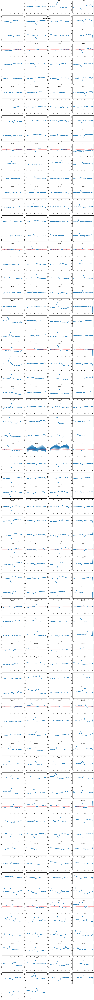

In [ ]:
files = sorted([f for f in os.listdir(data_path) if f.endswith('.txt')])
print(f"Total files: {len(files)}")

cols = 4
rows = (len(files) // cols) + 1
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3))
axes = axes.flatten()

for i, file in enumerate(files):
    try:
        data = np.loadtxt(os.path.join(data_path, file))
        axes[i].plot(data)
        axes[i].set_title(file, fontsize=8)
        axes[i].set_ylim(50, 210)
        axes[i].axhline(y=135, color='r', linestyle='--', alpha=0.3)
    except:
        axes[i].set_visible(False)

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle("RAW SIGNALS", fontsize=16)
plt.tight_layout(); plt.show()


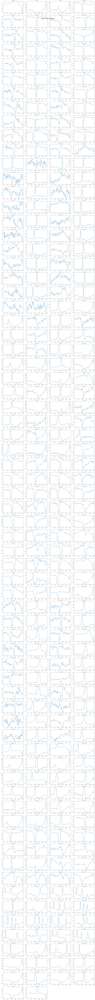

In [ ]:
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3))
axes = axes.flatten()

for i, file in enumerate(files):
    try:
        data  = np.loadtxt(os.path.join(data_path, file))
        clean = butter_bandpass_filter(data)
        axes[i].plot(clean)
        axes[i].set_title(file, fontsize=8)
    except:
        axes[i].set_visible(False)

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle("PREPROCESSED SIGNALS", fontsize=16)
plt.tight_layout(); plt.show()


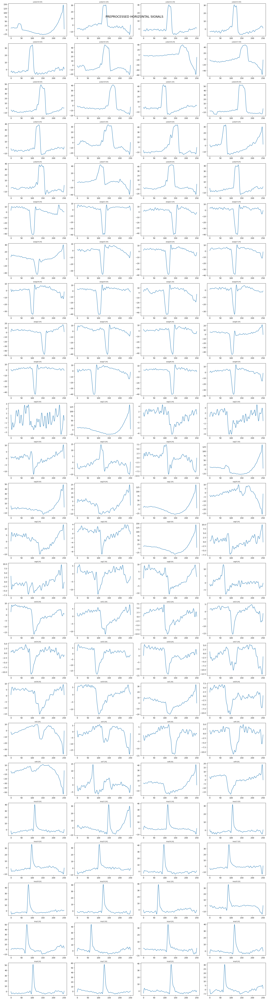

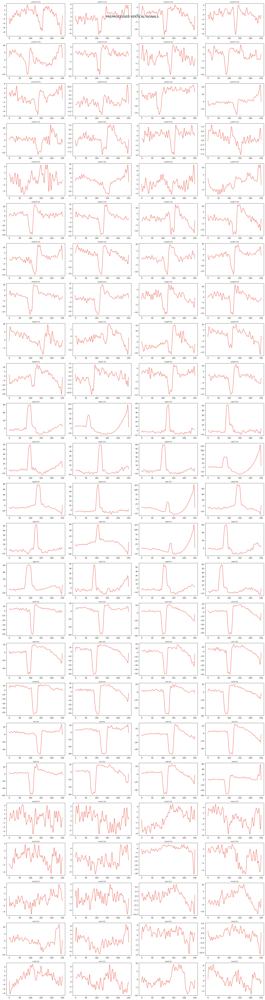

In [ ]:
h_signals, v_signals, titles = [], [], []

for movement in classes:
    files_v = sorted([f for f in os.listdir(data_path) if f.startswith(movement) and f.endswith('v.txt')])
    files_h = sorted([f for f in os.listdir(data_path) if f.startswith(movement) and f.endswith('h.txt')])
    for v_file, h_file in zip(files_v, files_h):
        try:
            v = np.loadtxt(os.path.join(data_path, v_file))
            h = np.loadtxt(os.path.join(data_path, h_file))
            h_clean, v_clean = preprocess_signal(v, h)
            h_signals.append(h_clean)
            v_signals.append(v_clean)
            titles.append(v_file.replace('v.txt', ''))
        except:
            continue

cols = 4
rows = (len(titles) // cols) + 1

fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3))
axes = axes.flatten()
for i, (h_sig, title) in enumerate(zip(h_signals, titles)):
    axes[i].plot(h_sig)
    axes[i].set_title(title + ' [H]', fontsize=8)
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)
plt.suptitle('PREPROCESSED HORIZONTAL SIGNALS', fontsize=16)
plt.tight_layout(); plt.show()

fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3))
axes = axes.flatten()
for i, (v_sig, title) in enumerate(zip(v_signals, titles)):
    axes[i].plot(v_sig, color='#E74C3C')
    axes[i].set_title(title + ' [V]', fontsize=8)
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)
plt.suptitle('PREPROCESSED VERTICAL SIGNALS', fontsize=16)
plt.tight_layout(); plt.show()


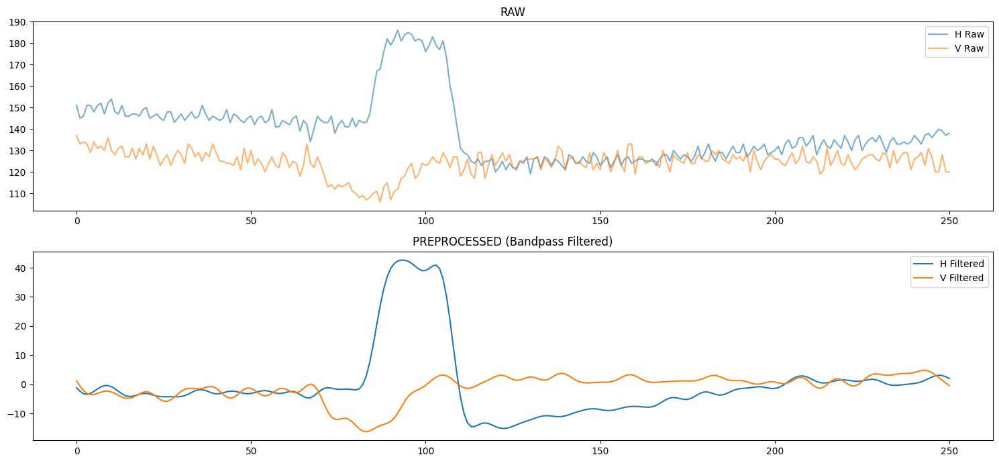

In [ ]:
movement = 'yukari'
trial    = 1

v_raw = np.loadtxt(os.path.join(data_path, f"{movement}{trial}v.txt"))
h_raw = np.loadtxt(os.path.join(data_path, f"{movement}{trial}h.txt"))
h_clean, v_clean = preprocess_signal(v_raw, h_raw)

plt.figure(figsize=(15, 7))
plt.subplot(2, 1, 1)
plt.plot(h_raw, label='H Raw', alpha=0.6); plt.plot(v_raw, label='V Raw', alpha=0.6)
plt.title('RAW'); plt.legend()
plt.subplot(2, 1, 2)
plt.plot(h_clean, label='H Filtered'); plt.plot(v_clean, label='V Filtered')
plt.title('PREPROCESSED (Bandpass Filtered)'); plt.legend()
plt.tight_layout(); plt.show()


In [ ]:
X, y = [], []

for label_idx, movement in enumerate(classes):
    files_v = sorted([f for f in os.listdir(data_path) if f.startswith(f"{movement}") and f.endswith('v.txt')])
    files_h = sorted([f for f in os.listdir(data_path) if f.startswith(f"{movement}") and f.endswith('h.txt')])

    for v_file, h_file in zip(files_v, files_h):
        try:
            v = np.loadtxt(os.path.join(data_path, v_file))
            h = np.loadtxt(os.path.join(data_path, h_file))
            h_only, v_only = preprocess_signal(v, h)
            X.extend([h_only, v_only])
            y.extend([label_idx, label_idx])
        except:
            continue

X = np.array(X)
y = np.array(y)
print(f"Dataset shape: {X.shape}")


Dataset shape: (200, 251)


Up: 40 signals
Down: 40 signals
Right: 40 signals
Left: 40 signals
Blink: 40 signals
DWT 'db1' extracted: 40 signals/class
DWT 'db2' extracted: 40 signals/class
DWT 'db4' extracted: 40 signals/class
Morphological features extracted.
AR Features: 7 features/signal
FEATURE EXTRACTION COMPLETE.


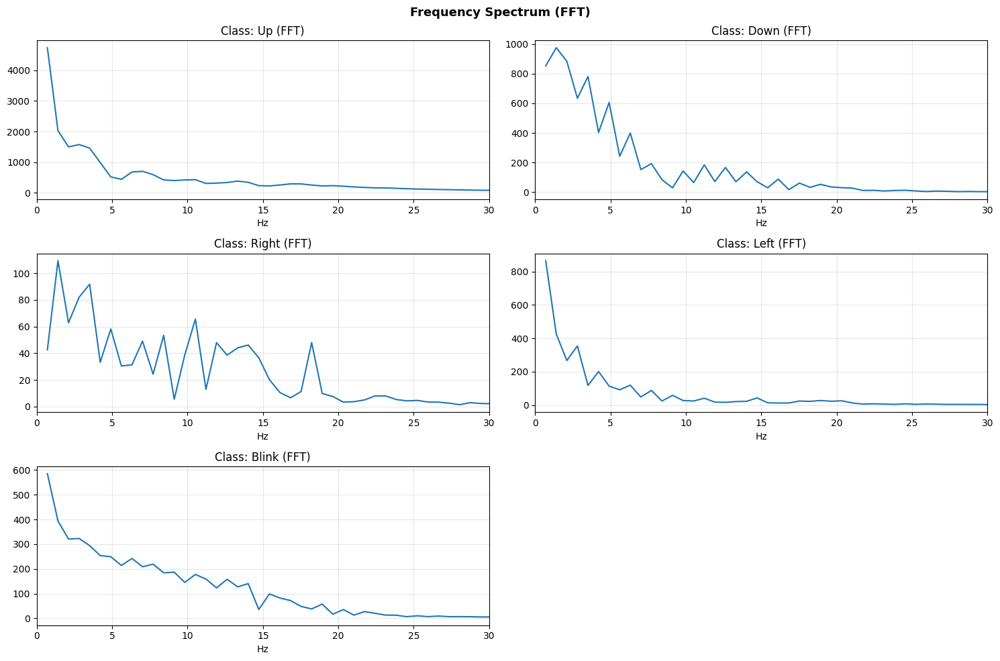

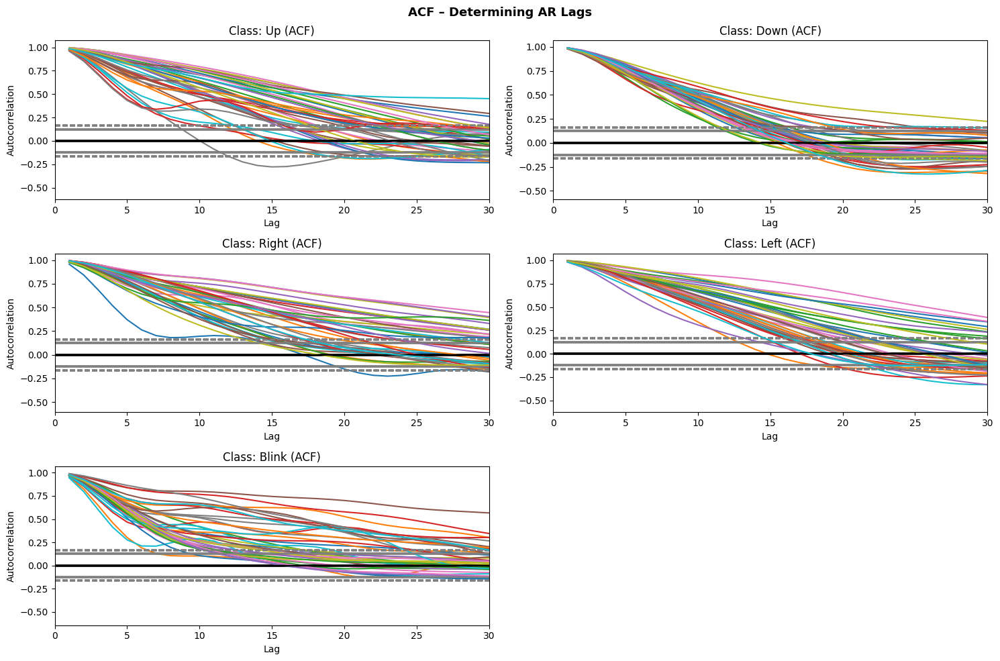

In [ ]:
normalized = {v: [] for v in class_mapping.values()}
for i, signal in enumerate(X):
    normalized[reverse_mapping[y[i]]].append(signal)

for cls, sigs in normalized.items():
    print(f"{cls}: {len(sigs)} signals")


def plot_fft(signals_dict, fs=fs):
    plt.figure(figsize=(15, 10))
    for i, (cls, signals) in enumerate(signals_dict.items()):
        if signals:
            signal    = signals[0]
            N         = len(signal)
            fft_vals  = np.fft.fft(signal)
            fft_freqs = np.fft.fftfreq(N, 1/fs)
            pos_mask  = fft_freqs > 0
            plt.subplot(3, 2, i+1)
            plt.plot(fft_freqs[pos_mask], np.abs(fft_vals)[pos_mask])
            plt.title(f"Class: {cls} (FFT)"); plt.xlabel("Hz"); plt.grid(True, alpha=0.3); plt.xlim(0,30)
    plt.suptitle("Frequency Spectrum (FFT)", fontsize=13, fontweight='bold')
    plt.tight_layout()

plot_fft(normalized)


def extract_dwt_features(signal, wavelet='db4'):
    coeffs             = pywt.wavedec(signal, wavelet, level=4)
    cA4, cD4, cD3, *_ = coeffs
    features = []
    for band in [cA4, cD4, cD3]:
        features.extend([np.mean(np.square(band)), np.mean(band),
                         np.std(band), np.max(np.abs(band))])
    return np.array(features)

wavelets_to_test = ['db1', 'db2', 'db4']
all_features     = {}
for w in wavelets_to_test:
    all_features[w] = {cls: [] for cls in class_mapping.values()}
    for cls, signals in normalized.items():
        for s in signals:
            all_features[w][cls].append(extract_dwt_features(s, wavelet=w))
    print(f"DWT '{w}' extracted: {len(all_features[w]['Up'])} signals/class")


def extract_morphological_features(signal):
    return np.array([np.max(signal), np.min(signal), np.trapezoid(np.abs(signal))])

morph_features = {cls: [] for cls in class_mapping.values()}
for cls, signals in normalized.items():
    for s in signals:
        morph_features[cls].append(extract_morphological_features(s))
print("Morphological features extracted.")


def plot_acf_all_classes(signals_dict):
    plt.figure(figsize=(15,10))
    for i, (cls, signals) in enumerate(signals_dict.items()):
        ax = plt.subplot(3, 2, i+1)
        for s in signals:
            autocorrelation_plot(s, ax=ax)
        plt.title(f"Class: {cls} (ACF)"); plt.xlim(0, 30)
    plt.suptitle("ACF – Determining AR Lags", fontsize=13, fontweight='bold')
    plt.tight_layout()

plot_acf_all_classes(normalized)


def extract_ar_features(signal, lags=6):
    return AutoReg(signal, lags=lags, old_names=False).fit().params

ar_features = {cls: [] for cls in class_mapping.values()}
for cls, signals in normalized.items():
    for s in signals:
        ar_features[cls].append(extract_ar_features(s, lags=6))
print(f"AR Features: {len(ar_features['Up'][0])} features/signal")

raw_features = {cls: list(signals) for cls, signals in normalized.items()}
print("FEATURE EXTRACTION COMPLETE.")


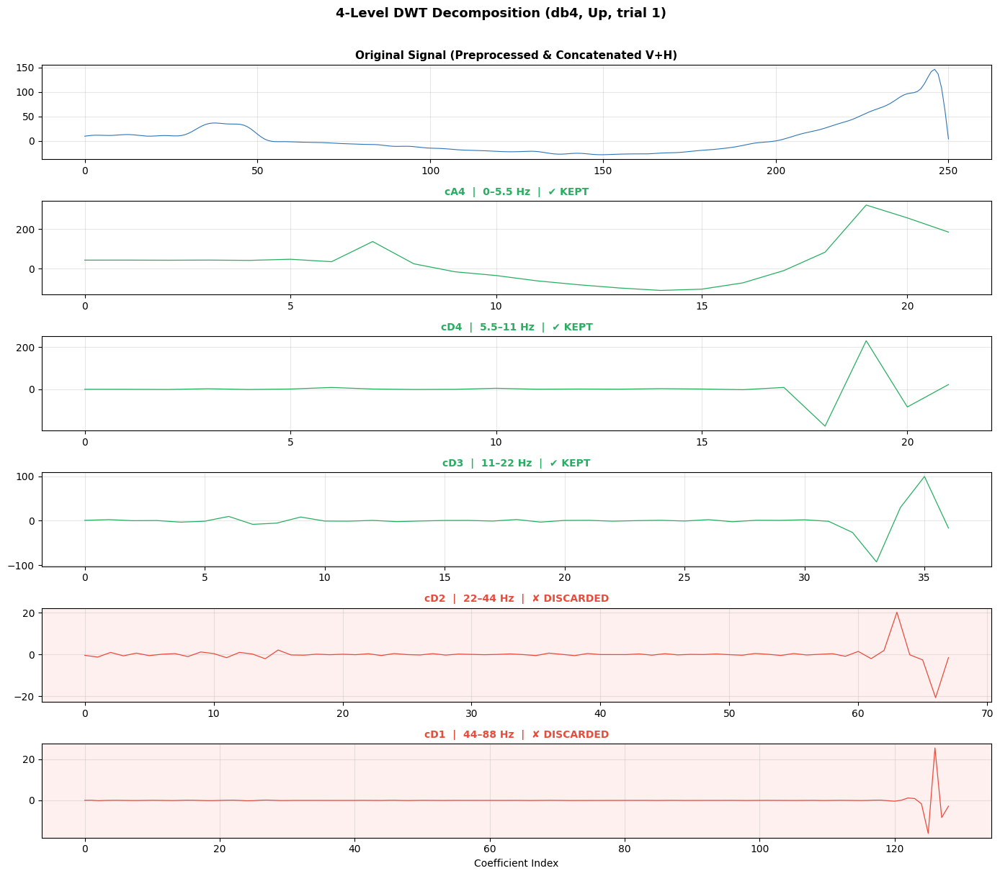

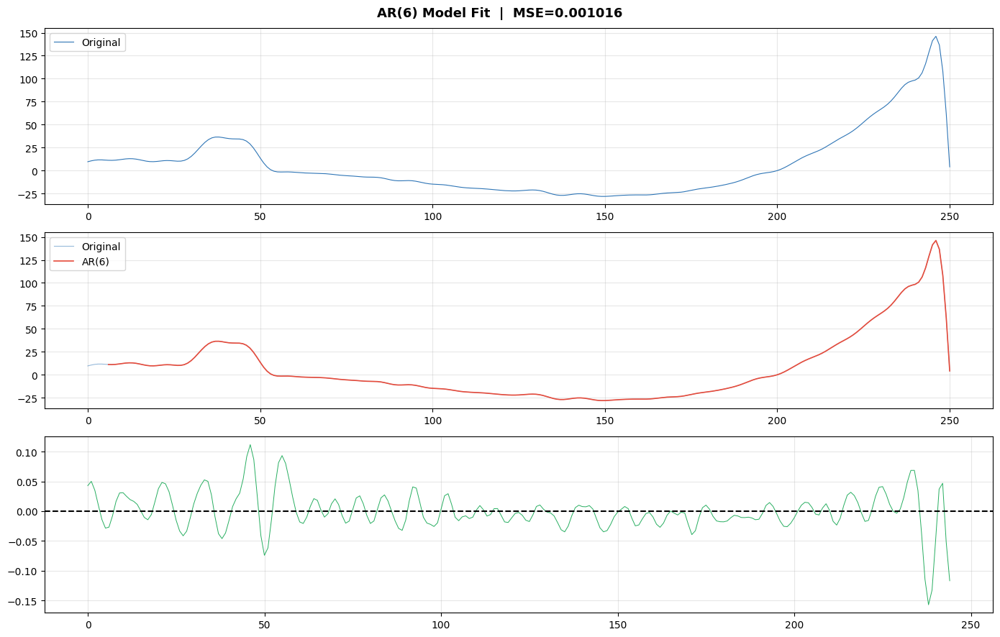

In [ ]:
SAMPLE_CLASS  = 'Up'
sample_signal = normalized[SAMPLE_CLASS][0]

coeffs= pywt.wavedec(sample_signal, 'db4', level=4)
cA4, cD4, cD3, cD2, cD1 = coeffs

band_labels = [
    ('cA4','0–5.5 Hz',  True, cA4),
    ('cD4','5.5–11 Hz', True, cD4),
    ('cD3','11–22 Hz',  True, cD3),
    ('cD2','22–44 Hz',  False,cD2),
    ('cD1','44–88 Hz',  False,cD1),
]

fig, axes = plt.subplots(6, 1, figsize=(14, 12))
axes[0].plot(sample_signal, color='#2E75B6', linewidth=0.8)
axes[0].set_title('Original Signal (Preprocessed & Concatenated V+H)', fontsize=11, fontweight='bold')
axes[0].grid(True, alpha=0.3)

for ax, (name, freq, keep, coef) in zip(axes[1:], band_labels):
    color = '#27AE60' if keep else '#E74C3C'
    ax.plot(coef, color=color, linewidth=0.9)
    ax.set_title(f'{name}  |  {freq}  |  {"✔ KEPT" if keep else "✘ DISCARDED"}',
                 fontsize=10, fontweight='bold', color=color)
    ax.grid(True, alpha=0.3)
    if not keep: ax.set_facecolor('#FFF0F0')

axes[-1].set_xlabel('Coefficient Index')
fig.suptitle('4-Level DWT Decomposition (db4, Up, trial 1)', fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout(); plt.savefig('plot_dwt_decomposition.png', dpi=150, bbox_inches='tight'); plt.show()

lags         = 6
model_fitted = AutoReg(sample_signal, lags=lags, old_names=False).fit()
ar_pred      = model_fitted.predict(start=lags, end=len(sample_signal)-1)
residuals    = sample_signal[lags:] - ar_pred

fig, axes = plt.subplots(3,1, figsize=(14,9))
axes[0].plot(sample_signal, color='#2E75B6', linewidth=0.8, label='Original'); axes[0].legend(); axes[0].grid(True,alpha=0.3)
axes[1].plot(sample_signal, color='#2E75B6', linewidth=0.8, alpha=0.5, label='Original')
axes[1].plot(np.arange(lags, len(sample_signal)), ar_pred, color='#E74C3C', linewidth=1.2, label=f'AR({lags})')
axes[1].legend(); axes[1].grid(True, alpha=0.3)
axes[2].plot(residuals, color='#27AE60', linewidth=0.7); axes[2].axhline(0, color='black', linestyle='--'); axes[2].grid(True,alpha=0.3)
fig.suptitle(f'AR(6) Model Fit  |  MSE={np.mean(residuals**2):.6f}', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.savefig('plot_ar_fit.png', dpi=150, bbox_inches='tight'); plt.show()


In [ ]:

cv_bin = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

COMBOS = {
    'db1':['db1'], 'db2':['db2'], 'db4':['db4'],
    'db1+db2':['db1','db2'], 'db1+db4':['db1','db4'], 'db2+db4':['db2','db4'],
    'db1+db2+db4':['db1','db2','db4'],
    'db1+morph':['db1','morph'], 'db2+morph':['db2','morph'], 'db4+morph':['db4','morph'],
    'db1+ar':['db1','ar'], 'db2+ar':['db2','ar'], 'db4+ar':['db4','ar'],
    'db1+morph+ar':['db1','morph','ar'], 'db2+morph+ar':['db2','morph','ar'],
    'db4+morph+ar':['db4','morph','ar'],
    'db1+db2+db4+morph':['db1','db2','db4','morph'],
    'db1+db2+db4+ar':['db1','db2','db4','ar'],
    'ALL':['db1','db2','db4','morph','ar'],
}
KERNELS  = ['linear', 'rbf', 'sigmoid', 'poly']
C_VALUES = [0.01, 0.1, 0.5, 1, 5]

def run_binary_cv(X, y, kernel, C, gamma='scale'):
    """Run 5-fold CV on a binary SVM; return (f1, prec, rec) for positive class."""
    pipe   = make_pipeline(StandardScaler(),
                           SVC(kernel=kernel, C=C, gamma=gamma, class_weight='balanced'))
    y_pred = cross_val_predict(pipe, X, y, cv=cv_bin)
    report = classification_report(y, y_pred, output_dict=True, zero_division=0)
    return report['1']['f1-score'], report['1']['precision'], report['1']['recall']

configs_per_side = len(COMBOS) * len(KERNELS) * len(C_VALUES)
print(f'Combos: {len(COMBOS)}  |  Kernels: {len(KERNELS)}  |  C values: {len(C_VALUES)}')
print(f'Experiments per (direction × signal_type): {configs_per_side}')
print(f'Total experiments: {len(DIRECTIONS)} directions × 2 signals × {configs_per_side}'
      f' = {len(DIRECTIONS)*2*configs_per_side}')


Combos: 19  |  Kernels: 4  |  C values: 5
Experiments per (direction × signal_type): 380
Total experiments: 5 directions × 2 signals × 380 = 3800


In [ ]:
# ── Load raw H/V signals per direction + precompute all feature types ──────
binary_feats = {}   # direction → signal_type → feat_type → [feat_vec, ...]

for direction, prefix in DIRECTIONS.items():
    files_v = sorted([f for f in os.listdir(data_path)
                      if f.startswith(prefix) and f.endswith('v.txt')])
    files_h = sorted([f for f in os.listdir(data_path)
                      if f.startswith(prefix) and f.endswith('h.txt')])

    h_sigs, v_sigs = [], []
    for v_file, h_file in zip(files_v, files_h):
        try:
            v_raw = np.loadtxt(os.path.join(data_path, v_file))
            h_raw = np.loadtxt(os.path.join(data_path, h_file))
            h_clean, v_clean = preprocess_signal(v_raw, h_raw)
            h_sigs.append(h_clean)
            v_sigs.append(v_clean)
        except Exception as e:
            print(f'  Skipping {v_file}: {e}')

    binary_feats[direction] = {}
    for sig_type, sigs in [('h', h_sigs), ('v', v_sigs)]:
        binary_feats[direction][sig_type] = {
            'db1'  : [extract_dwt_features(s, wavelet='db1')  for s in sigs],
            'db2'  : [extract_dwt_features(s, wavelet='db2')  for s in sigs],
            'db4'  : [extract_dwt_features(s, wavelet='db4')  for s in sigs],
            'morph': [extract_morphological_features(s)        for s in sigs],
            'ar'   : [extract_ar_features(s, lags=6)           for s in sigs],
        }
    print(f'  {direction:6s} → {len(h_sigs)} H  |  {len(v_sigs)} V samples')

print('\nAll feature types precomputed for H and V per direction.')


def build_binary_dataset_combo(target, signal_type, blocks):
    """Binary dataset (target=1, others=0) using specified feature blocks."""
    X_out, y_out = [], []
    for direction in DIRECTIONS:
        n = len(binary_feats[direction][signal_type][blocks[0]])
        for i in range(n):
            parts = [binary_feats[direction][signal_type][blk][i] for blk in blocks]
            X_out.append(np.concatenate(parts))
            y_out.append(1 if direction == target else 0)
    return np.array(X_out), np.array(y_out)


  Left   → 20 H  |  20 V samples
  Right  → 20 H  |  20 V samples
  Up     → 20 H  |  20 V samples
  Down   → 20 H  |  20 V samples
  Blink  → 20 H  |  20 V samples

All feature types precomputed for H and V per direction.


In [ ]:

binary_results   = {}   # direction → selection info
movement_grid_df = {}   # direction → full grid DataFrame

for direction in DIRECTIONS:
    print(f'\n{"="*65}')
    print(f'  MOVEMENT: {direction.upper()}')
    print(f'{"="*65}')

    records_dir = []

    for sig_type in ('h', 'v'):
        label_str = 'Horizontal' if sig_type == 'h' else 'Vertical'
        print(f'\n  [{label_str}] grid search …', end='', flush=True)
        done = 0
        step = len(KERNELS) * len(C_VALUES) * 3   # print every 3 combos
        for combo_name, blocks in COMBOS.items():
            X_b, y_b = build_binary_dataset_combo(direction, sig_type, blocks)
            n_feat   = X_b.shape[1]
            for kernel in KERNELS:
                for C in C_VALUES:
                    try:
                        f1, prec, rec = run_binary_cv(X_b, y_b, kernel, C)
                    except Exception:
                        f1, prec, rec = None, None, None
                    records_dir.append({
                        'Direction': direction, 'Signal': sig_type,
                        'Features' : combo_name, 'n_feat': n_feat,
                        'Kernel'   : kernel,     'C'     : C,
                        'F1'  : round(f1*100,   2) if f1   is not None else None,
                        'Prec': round(prec*100, 2) if prec is not None else None,
                        'Rec' : round(rec*100,  2) if rec  is not None else None,
                    })
                    done += 1
        print(f' done ({done} configs)')

    df_dir = pd.DataFrame(records_dir)
    movement_grid_df[direction] = df_dir

    # Best combo per signal type
    def best_row(sig):
        sub = df_dir[df_dir['Signal'] == sig].dropna(subset=['F1'])
        if sub.empty:
            return None, 0.0, 'rbf', 5
        row = sub.loc[sub['F1'].idxmax()]
        return row['Features'], float(row['F1']), row['Kernel'], float(row['C'])

    h_combo, h_f1_pct, h_kernel, h_C = best_row('h')
    v_combo, v_f1_pct, v_kernel, v_C = best_row('v')

    best_type = 'h' if h_f1_pct >= v_f1_pct else 'v'
    binary_results[direction] = {
        'h_f1': h_f1_pct/100, 'h_combo': h_combo, 'h_kernel': h_kernel, 'h_C': h_C,
        'v_f1': v_f1_pct/100, 'v_combo': v_combo, 'v_kernel': v_kernel, 'v_C': v_C,
        'best': best_type,
        'best_combo' : h_combo  if best_type == 'h' else v_combo,
        'best_kernel': h_kernel if best_type == 'h' else v_kernel,
        'best_C'     : h_C      if best_type == 'h' else v_C,
    }

    winner = 'HORIZONTAL' if best_type == 'h' else 'VERTICAL'
    print(f'\n  Best H  →  combo: {h_combo:25s}  F1={h_f1_pct:.1f}%'
          f'  ({h_kernel}, C={h_C})')
    print(f'  Best V  →  combo: {v_combo:25s}  F1={v_f1_pct:.1f}%'
          f'  ({v_kernel}, C={v_C})')
    print(f'  ➜  Selected: {winner}  with combo \'{binary_results[direction]["best_combo"]!s}\'')

print(f'\n{"="*65}')
print('  Grid complete!')



  MOVEMENT: LEFT

  [Horizontal] grid search … done (380 configs)

  [Vertical] grid search … done (380 configs)

  Best H  →  combo: db1+db4                    F1=72.0%  (linear, C=5.0)
  Best V  →  combo: db1+morph                  F1=100.0%  (linear, C=0.1)
  ➜  Selected: VERTICAL  with combo 'db1+morph'

  MOVEMENT: RIGHT

  [Horizontal] grid search … done (380 configs)

  [Vertical] grid search … done (380 configs)

  Best H  →  combo: db4+morph+ar               F1=67.9%  (linear, C=0.1)
  Best V  →  combo: db1+morph                  F1=100.0%  (linear, C=1.0)
  ➜  Selected: VERTICAL  with combo 'db1+morph'

  MOVEMENT: UP

  [Horizontal] grid search … done (380 configs)

  [Vertical] grid search … done (380 configs)

  Best H  →  combo: db1+db4                    F1=90.0%  (linear, C=5.0)
  Best V  →  combo: db1+db2                    F1=54.0%  (sigmoid, C=5.0)
  ➜  Selected: HORIZONTAL  with combo 'db1+db4'

  MOVEMENT: DOWN

  [Horizontal] grid search … done (380 configs)

  [

  SELECTION SUMMARY  (best combo + signal type per movement)
  Dir       Signal        Best Combo                   H F1    V F1   Win F1
  ----------------------------------------------------------------------
  Left      Vertical      db1+morph                    72.0%   100.0%    100.0%
  Right     Vertical      db1+morph                    67.9%   100.0%    100.0%
  Up        Horizontal    db1+db4                      90.0%    54.0%     90.0%
  Down      Horizontal    db1+morph+ar                100.0%    74.5%    100.0%
  Blink     Horizontal    db1+db2                     100.0%    71.4%    100.0%


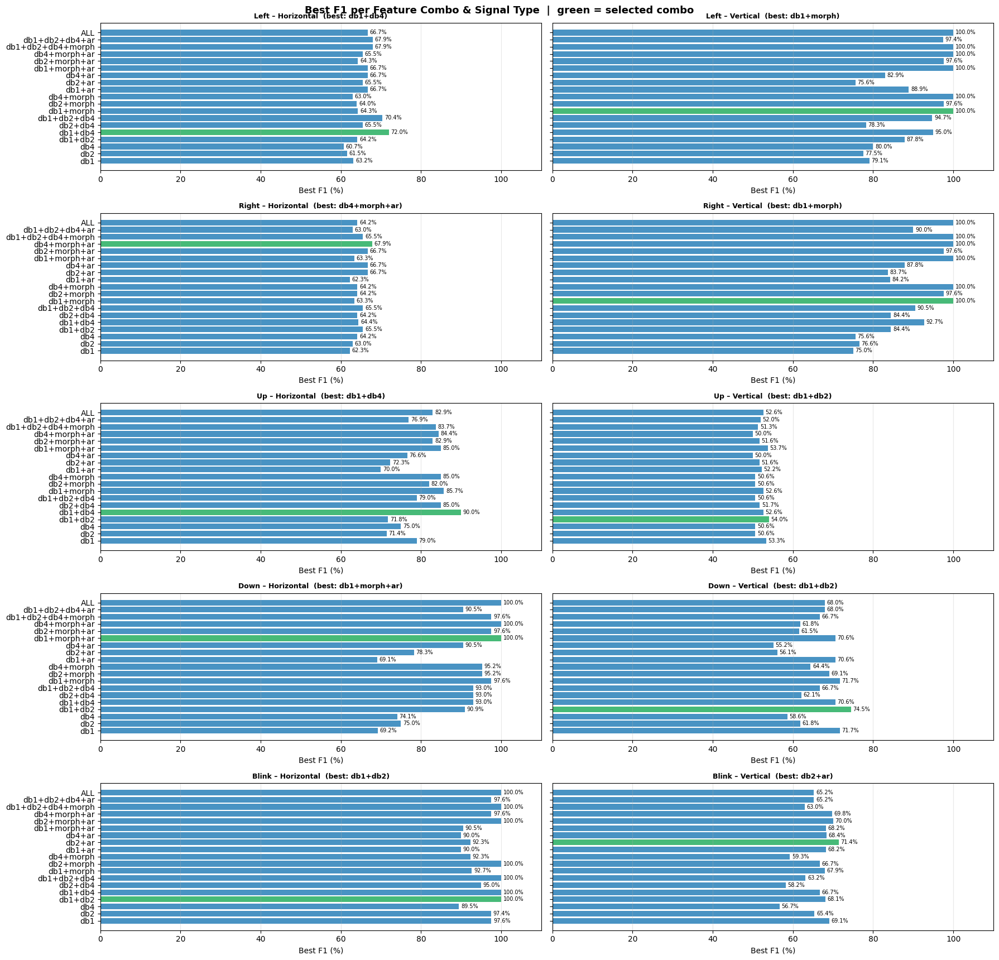

Saved: directional_binary_combo_f1.png


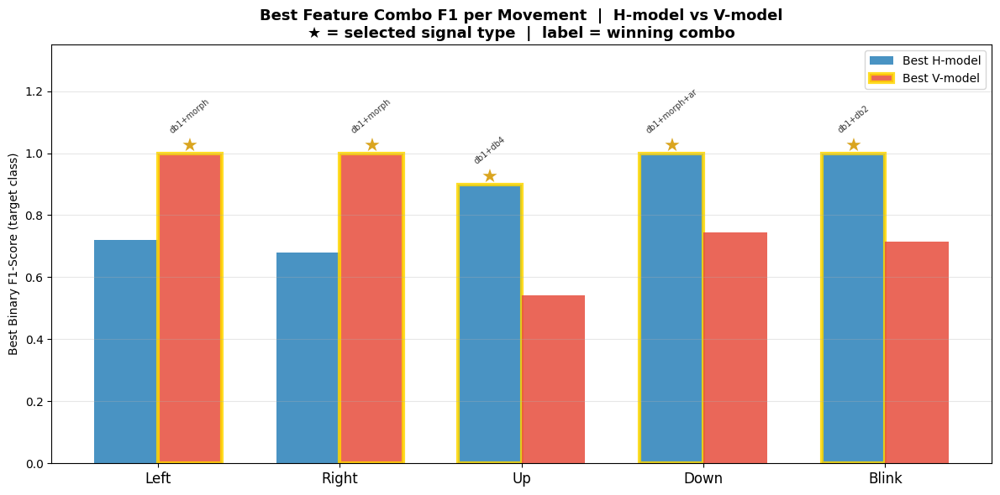

Saved: directional_binary_f1.png


In [ ]:
# ── Selection summary ────────────────────────────────────────────────────────
print('=' * 78)
print('  SELECTION SUMMARY  (best combo + signal type per movement)')
print('=' * 78)
print(f"  {'Dir':8s}  {'Signal':12s}  {'Best Combo':25s}  "
      f"{'H F1':>6s}  {'V F1':>6s}  {'Win F1':>7s}")
print('  ' + '-' * 70)
for d, r in binary_results.items():
    w      = 'Horizontal' if r['best'] == 'h' else 'Vertical'
    win_f1 = max(r['h_f1'], r['v_f1'])
    print(f"  {d:8s}  {w:12s}  {r['best_combo']:25s}  "
          f"{r['h_f1']*100:6.1f}%  {r['v_f1']*100:6.1f}%  {win_f1*100:7.1f}%")

# ── Horizontal bar chart: best combo F1 per movement × signal type ──────────
fig, axes = plt.subplots(len(DIRECTIONS), 2,
                         figsize=(18, 3.5 * len(DIRECTIONS)), sharey='row')

for row_idx, direction in enumerate(DIRECTIONS):
    df_dir = movement_grid_df[direction]
    for col_idx, sig_type in enumerate(('h', 'v')):
        ax  = axes[row_idx, col_idx]
        sub = df_dir[df_dir['Signal'] == sig_type].dropna(subset=['F1'])
        if sub.empty:
            ax.set_visible(False); continue
        best_per_combo = (sub.groupby('Features')['F1'].max()
                           .reindex(list(COMBOS.keys())).fillna(0))
        winner_combo = binary_results[direction][f'{sig_type}_combo']
        colors = ['#27AE60' if c == winner_combo else '#2980B9'
                  for c in best_per_combo.index]
        ax.barh(best_per_combo.index, best_per_combo.values,
                color=colors, alpha=0.85)
        for val, name in zip(best_per_combo.values, best_per_combo.index):
            ax.text(val + 0.5, list(best_per_combo.index).index(name),
                    f'{val:.1f}%', va='center', fontsize=7)
        sig_label = 'Horizontal' if sig_type == 'h' else 'Vertical'
        ax.set_title(f'{direction} – {sig_label}  '
                     f'(best: {binary_results[direction][f"{sig_type}_combo"]})',
                     fontsize=9, fontweight='bold')
        ax.set_xlabel('Best F1 (%)')
        ax.set_xlim(0, 110)
        ax.grid(axis='x', alpha=0.3)

plt.suptitle('Best F1 per Feature Combo & Signal Type  |  green = selected combo',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('directional_binary_combo_f1.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: directional_binary_combo_f1.png')

# ── Bar chart: best H vs best V F1 per movement ──────────────────────────────
dirs   = list(binary_results.keys())
h_f1s  = [binary_results[d]['h_f1'] for d in dirs]
v_f1s  = [binary_results[d]['v_f1'] for d in dirs]
bests  = [binary_results[d]['best'] for d in dirs]

x     = np.arange(len(dirs))
width = 0.35
fig, ax = plt.subplots(figsize=(12, 6))
bars_h = ax.bar(x - width/2, h_f1s, width, label='Best H-model', color='#2980B9', alpha=0.85)
bars_v = ax.bar(x + width/2, v_f1s, width, label='Best V-model', color='#E74C3C', alpha=0.85)

for i, (bh, bv, best) in enumerate(zip(bars_h, bars_v, bests)):
    wb           = bh if best == 'h' else bv
    combo_label  = binary_results[dirs[i]]['best_combo']
    wb.set_edgecolor('gold'); wb.set_linewidth(3)
    ax.text(wb.get_x() + wb.get_width()/2, wb.get_height() + 0.005,
            '★', ha='center', fontsize=16, color='goldenrod')
    ax.text(wb.get_x() + wb.get_width()/2, wb.get_height() + 0.065,
            combo_label, ha='center', fontsize=7, rotation=40, color='#333')

ax.set_xticks(x); ax.set_xticklabels(dirs, fontsize=12)
ax.set_ylabel('Best Binary F1-Score (target class)')
ax.set_title('Best Feature Combo F1 per Movement  |  H-model vs V-model\n'
             '★ = selected signal type  |  label = winning combo',
             fontsize=13, fontweight='bold')
ax.set_ylim(0, 1.35); ax.legend(); ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig('directional_binary_f1.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: directional_binary_f1.png')


In [ ]:
# ── Choose unified feature combo for final model ─────────────────────────────
from collections import Counter

combo_votes  = Counter(r['best_combo'] for r in binary_results.values())
best_f1_per_combo = {}
for d, r in binary_results.items():
    c   = r['best_combo']
    f1  = max(r['h_f1'], r['v_f1'])
    best_f1_per_combo[c] = best_f1_per_combo.get(c, 0) + f1

# Primary sort: most votes; tie-break: highest cumulative F1
final_combo_name = max(combo_votes, key=lambda c: (combo_votes[c], best_f1_per_combo[c]))
final_blocks     = COMBOS[final_combo_name]

print('Combo vote counts across movements:')
for combo, votes in combo_votes.most_common():
    avg_f1 = best_f1_per_combo[combo] / votes
    marker = '  ← SELECTED' if combo == final_combo_name else ''
    print(f'  {combo:25s}  votes={votes}  avg_win_F1={avg_f1*100:.1f}%{marker}')

print(f'\nFinal feature combo: "{final_combo_name}"  (blocks: {final_blocks})')

# ── Build final dataset ───────────────────────────────────────────────────────
X_final, y_final = [], []

print('\nBuilding final dataset:')
print('-' * 60)
for direction, label in DIRECTION_LABEL.items():
    best_type  = binary_results[direction]['best']
    n          = len(binary_feats[direction][best_type][final_blocks[0]])
    type_label = 'Horizontal' if best_type == 'h' else 'Vertical'
    for i in range(n):
        parts = [binary_feats[direction][best_type][blk][i] for blk in final_blocks]
        X_final.append(np.concatenate(parts))
        y_final.append(label)
    print(f'  {direction:6s} (label={label}) → {type_label:12s}  '
          f'combo={final_combo_name:20s}  {n} samples')

X_final = np.array(X_final)
y_final = np.array(y_final)
print(f'\nFinal dataset shape: {X_final.shape}')


Combo vote counts across movements:
  db1+morph                  votes=2  avg_win_F1=100.0%  ← SELECTED
  db1+db4                    votes=1  avg_win_F1=90.0%
  db1+morph+ar               votes=1  avg_win_F1=100.0%
  db1+db2                    votes=1  avg_win_F1=100.0%

Final feature combo: "db1+morph"  (blocks: ['db1', 'morph'])

Building final dataset:
------------------------------------------------------------
  Left   (label=0) → Vertical      combo=db1+morph             20 samples
  Right  (label=1) → Vertical      combo=db1+morph             20 samples
  Up     (label=2) → Horizontal    combo=db1+morph             20 samples
  Down   (label=3) → Horizontal    combo=db1+morph             20 samples
  Blink  (label=4) → Horizontal    combo=db1+morph             20 samples

Final dataset shape: (100, 15)


  FINAL 5-CLASS MODEL – CROSS-VALIDATION RESULTS
              precision    recall  f1-score   support

        Left       1.00      1.00      1.00        20
       Right       0.81      0.85      0.83        20
          Up       0.84      0.80      0.82        20
        Down       1.00      1.00      1.00        20
       Blink       0.90      0.90      0.90        20

    accuracy                           0.91       100
   macro avg       0.91      0.91      0.91       100
weighted avg       0.91      0.91      0.91       100



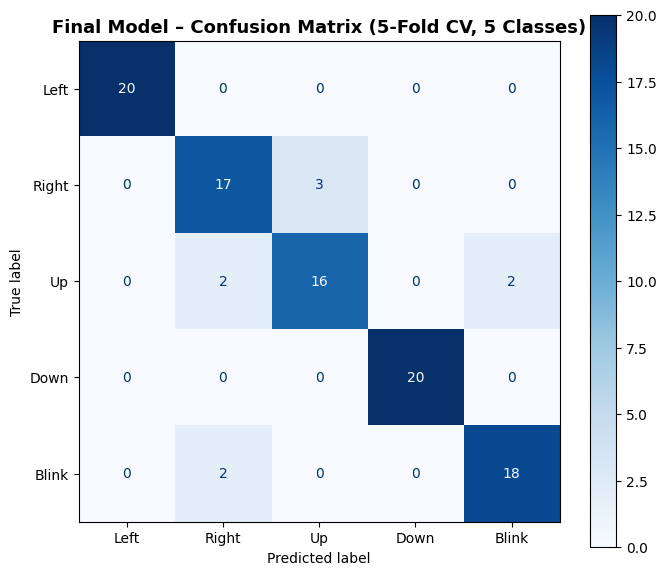


Train Acc per fold : [100.   100.   100.   100.    98.75]
Val   Acc per fold : [95. 90. 85. 90. 95.]
Mean Train Acc     : 99.75%
Mean Val   Acc     : 91.00%
Gap                : 8.75%


In [ ]:
cv_final    = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
label_names = ['Left', 'Right', 'Up', 'Down', 'Blink']

final_pipe = make_pipeline(
    StandardScaler(),
    SVC(kernel='rbf', C=5, gamma='scale', class_weight='balanced',
        decision_function_shape='ovr')
)

y_pred_final = cross_val_predict(final_pipe, X_final, y_final, cv=cv_final)

print("=" * 65)
print("  FINAL 5-CLASS MODEL – CROSS-VALIDATION RESULTS")
print("=" * 65)
print(classification_report(y_final, y_pred_final, target_names=label_names))

# Confusion matrix
cm  = confusion_matrix(y_final, y_pred_final)
fig, ax = plt.subplots(figsize=(7, 6))
ConfusionMatrixDisplay(cm, display_labels=label_names).plot(ax=ax, colorbar=True, cmap='Blues')
ax.set_title('Final Model – Confusion Matrix (5-Fold CV, 5 Classes)', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('final_confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

scores = cross_validate(final_pipe, X_final, y_final, cv=cv_final,
                        scoring='accuracy', return_train_score=True)
print(f"\nTrain Acc per fold : {np.round(scores['train_score']*100, 2)}")
print(f"Val   Acc per fold : {np.round(scores['test_score']*100,  2)}")
print(f"Mean Train Acc     : {np.mean(scores['train_score'])*100:.2f}%")
print(f"Mean Val   Acc     : {np.mean(scores['test_score'])*100:.2f}%")
print(f"Gap                : {(np.mean(scores['train_score'])-np.mean(scores['test_score']))*100:.2f}%")


In [ ]:
import json as _json

final_pipe.fit(X_final, y_final)
joblib.dump(final_pipe, 'final_directional_model.pkl')

selection_map = {d: binary_results[d]['best'] for d in DIRECTIONS}
with open('direction_signal_selection.json', 'w') as f:
    _json.dump(selection_map, f, indent=2)

print("Saved: final_directional_model.pkl")
print("Saved: direction_signal_selection.json")
print("Selection map:", selection_map)


Saved: final_directional_model.pkl
Saved: direction_signal_selection.json
Selection map: {'Left': 'v', 'Right': 'v', 'Up': 'h', 'Down': 'h', 'Blink': 'h'}


## Testing – Predict a New Sample

In [ ]:
import json as _json

final_model = joblib.load('final_directional_model.pkl')

FINAL_REVERSE = {0: 'Left', 1: 'Right', 2: 'Up', 3: 'Down', 4: 'Blink'}

def feat_from_signal(sig):
    dwt   = extract_dwt_features(sig, wavelet='db1')
    morph = extract_morphological_features(sig)
    return np.concatenate([dwt, morph])

def predict_all_columns(excel_path):
    df = pd.read_excel(excel_path, header=None)
    print(f"File loaded: {df.shape[1]} columns\n")

    for col_idx in range(df.shape[1]):
        sig  = df.iloc[:, col_idx].values.astype(float)
        sig  = butter_bandpass_filter(sig)
        feat = feat_from_signal(sig).reshape(1, -1)
        pred = final_model.predict(feat)[0]
        print(f"  Column {col_idx} → {FINAL_REVERSE[pred]}")

predict_all_columns('/content/hcitest.xlsx')

File loaded: 9 columns

  Column 0 → Left
  Column 1 → Right
  Column 2 → Blink
  Column 3 → Down
  Column 4 → Down
  Column 5 → Blink
  Column 6 → Up
  Column 7 → Right
  Column 8 → Blink
